In [12]:
import dynamo as dyn 
import spateo as st 
import anndata


|-----> setting visualization default mode in dynamo. Your customized matplotlib settings might be overritten.
Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [13]:
adata = anndata.read('/lab/solexa_weissman/kmin/git/spateo-notebooks/segmentation/data/E16.5_E1S3.h5ad')

(<Figure size 400x400 with 1 Axes>, <AxesSubplot:title={'center':'stain'}>)

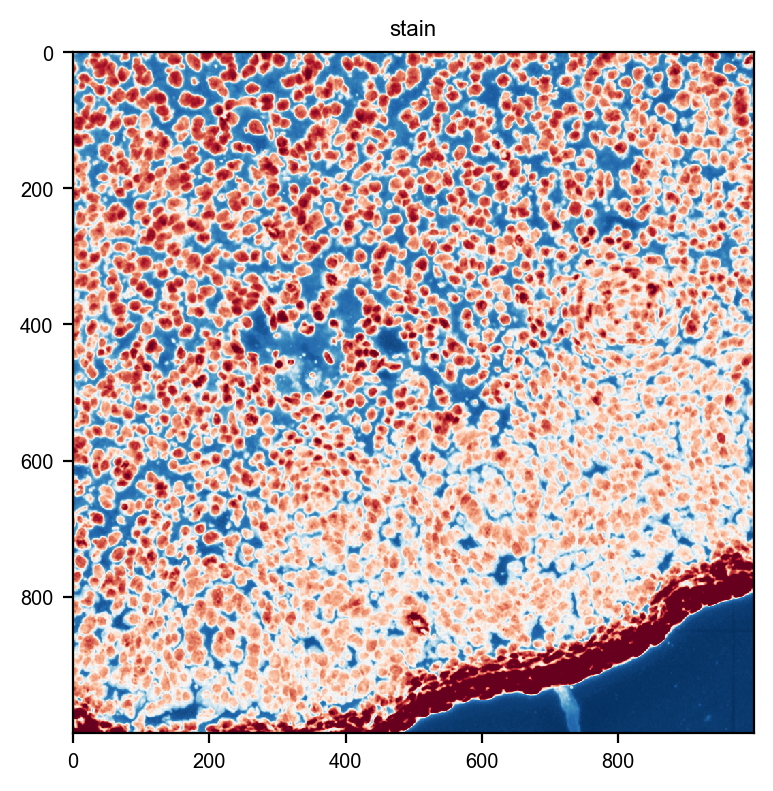

In [14]:
st.pl.imshow(adata[17000-5000:18000-5000,23000-8000:24000-8000], 'stain', use_scale=False)

In [18]:
adata

AnnData object with n_obs × n_vars = 29000 × 18461
    uns: '__type', 'spatial'
    layers: 'X_bins', 'X_labels', 'X_labels_expanded', 'X_mask', 'X_scores', 'cell_labels', 'cell_labels_expanded', 'labels', 'nuclear', 'nuclear_labels', 'nuclear_mask', 'nuclear_scores', 'spliced', 'stain', 'stain_cell_mask', 'stain_labels', 'stain_markers', 'stain_mask', 'unspliced', 'unspliced_bins', 'unspliced_labels', 'unspliced_mask', 'unspliced_scores'

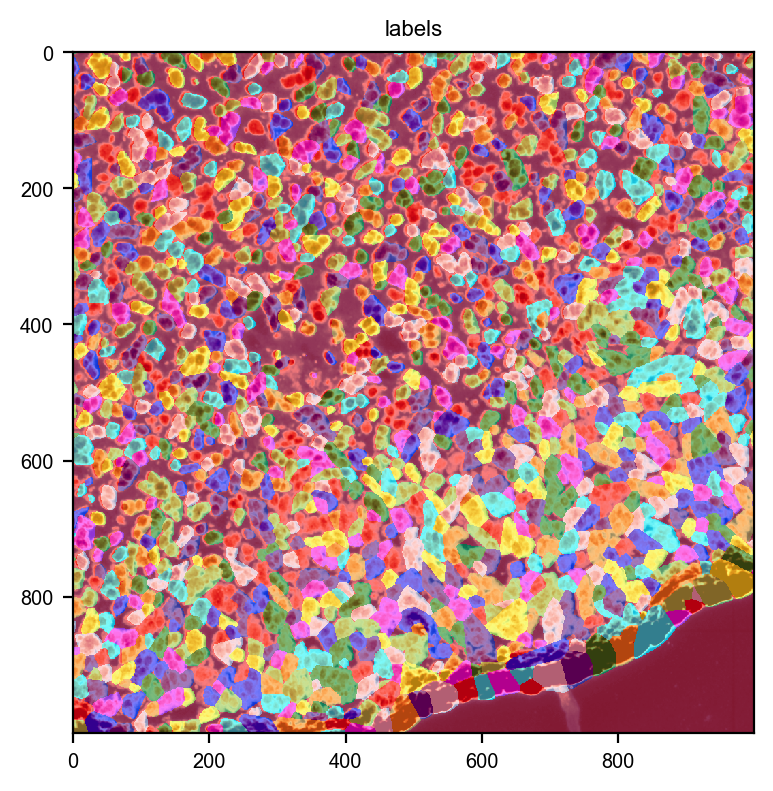

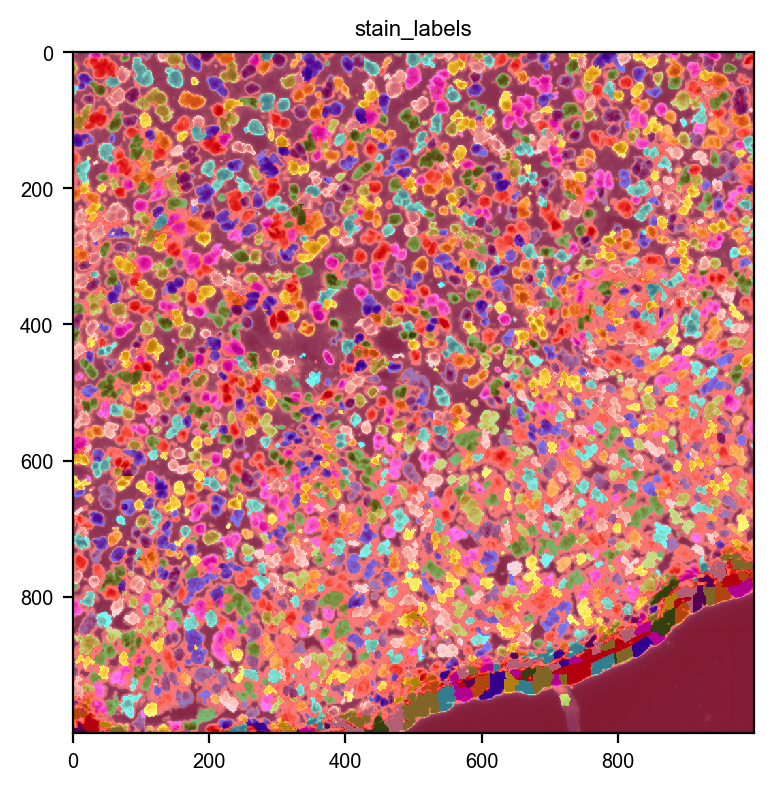

In [4]:
# BGI labels
fig, ax = st.pl.imshow(adata[17000-5000:18000-5000,23000-8000:24000-8000], 'stain', use_scale=False)
st.pl.imshow(adata[17000-5000:18000-5000,23000-8000:24000-8000], 'labels', labels=True, use_scale=False, ax=ax, alpha=0.5)

# Spateo nuclei labels
fig, ax = st.pl.imshow(adata[17000-5000:18000-5000,23000-8000:24000-8000], 'stain', use_scale=False)
st.pl.imshow(adata[17000-5000:18000-5000,23000-8000:24000-8000], 'stain_labels', labels=True, use_scale=False, ax=ax, alpha=0.5)

In [5]:
adata

AnnData object with n_obs × n_vars = 29000 × 18461
    uns: '__type', 'spatial'
    layers: 'X_bins', 'X_labels', 'X_labels_expanded', 'X_mask', 'X_scores', 'cell_labels', 'cell_labels_expanded', 'labels', 'nuclear', 'nuclear_labels', 'nuclear_mask', 'nuclear_scores', 'spliced', 'stain', 'stain_cell_mask', 'stain_labels', 'stain_markers', 'stain_mask', 'unspliced', 'unspliced_bins', 'unspliced_labels', 'unspliced_mask', 'unspliced_scores'

# segment the neuron dataset (using the two deep models from stereopy)

/lab/solexa_weissman/xqiu/python37_nice/lib/python3.7/site-packages/geopandas-0.10.2-py3.7.egg/geopandas/_compat.py:115: UserWarning: The Shapely GEOS version (3.10.2-CAPI-1.16.0) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
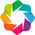

2022-03-17 01:15:01.382113: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /lab/solexa_weissman/xqiu/python37_nice/lib/python3.7/site-packages/cv2/../../lib64:
2022-03-17 01:15:01.382161: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
I0317 01:15:05.919490 10112 cell_seg_pipeline.py:38] Create new dir : ./stereopy/
I0317 01:15:05.921697 10112 cell_seg_pipeline.py:43] Transform 16bit to 8bit : 0.00


26455 26449
【image 1/1】


100%|█████████████████████████████████████████| 882/882 [57:43<00:00,  3.93s/it]
I0317 02:13:06.917206 10112 cell_seg_pipeline.py:202] Cell inference : 3480.98
I0317 02:15:48.876681 10112 cell_seg_pipeline.py:209] Post-processing : 161.96
I0317 02:16:15.172636 10112 cell_seg_pipeline.py:212] Result saved : ./stereopy/ 


In [1]:
from stereo import image as im

model_path = '/lab/solexa_weissman/xqiu/proj/Aristotle/spateo_project/segmentation_paper/stereopy/deep_model/seg_model_20211210.pth'
img_path = '/lab/solexa_weissman/xqiu/proj/Aristotle/spateo_project/segmentation_paper/SS200000135IL-D1_mrna.matched.ssDNA.tif'
out_path = './stereopy/'

im.cell_seg(model_path, img_path, out_path)

In [2]:
model_dir = './lab/solexa_weissman/xqiu/proj/Aristotle/spateo_project/segmentation_paper/stereopy/our_model/'
out_path = './deepcell/'

img_path = '/lab/solexa_weissman/xqiu/proj/Aristotle/spateo_project/segmentation_paper/SS200000135IL-D1_mrna.matched.ssDNA.tif'

im.cell_seg(model_path, img_path, out_path)

I0317 02:16:16.567689 10112 cell_seg_pipeline.py:38] Create new dir : ./deepcell/
I0317 02:16:16.570847 10112 cell_seg_pipeline.py:43] Transform 16bit to 8bit : 0.00


26455 26449
【image 1/1】


100%|█████████████████████████████████████████| 882/882 [59:14<00:00,  4.03s/it]
I0317 03:15:45.978822 10112 cell_seg_pipeline.py:202] Cell inference : 3569.41
I0317 03:18:27.201482 10112 cell_seg_pipeline.py:209] Post-processing : 161.22
I0317 03:18:52.232413 10112 cell_seg_pipeline.py:212] Result saved : ./deepcell/ 


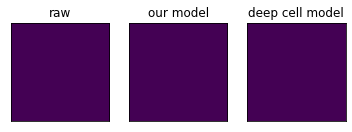

In [8]:
# %matplotlib inline

import matplotlib.pyplot as plt

import PIL
PIL.Image.MAX_IMAGE_PIXELS = None

_, axes = plt.subplots(1, 3)
im = plt.imread('/lab/solexa_weissman/xqiu/proj/Aristotle/spateo_project/segmentation_paper/SS200000135IL-D1_mrna.matched.ssDNA.tif')
im_subset = im[17000:18000,23000:24000]
axes[0].imshow(im_subset)
_ = axes[0].set_title("raw")
axes[0].set_yticks([])
axes[0].set_xticks([])

im = plt.imread('./stereopy/SS200000135IL-D1_mrna.matched.ssDNA_mask.tif')
im_subset = im[19000:21000,16000:18000]
axes[1].imshow(im_subset)
_ = axes[1].set_title("our model")
axes[1].set_yticks([])
axes[1].set_xticks([])

im = plt.imread('./deepcell/SS200000135IL-D1_mrna.matched.ssDNA_mask.tif')
im_subset = im[19000:21000,16000:18000]
axes[2].imshow(im_subset)
_ = axes[2].set_title("deep cell model")
axes[2].set_yticks([])
_ = axes[2].set_xticks([])

# save the small region and segment only that region

In [42]:
from PIL import Image
im = Image.fromarray(adata[17000-5000:18000-5000,23000-8000:24000-8000].layers['stain'])
im.save("range.jpg") 

/lab/solexa_weissman/xqiu/python37_nice/lib/python3.7/site-packages/geopandas-0.10.2-py3.7.egg/geopandas/_compat.py:115: UserWarning: The Shapely GEOS version (3.10.2-CAPI-1.16.0) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
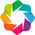

2022-03-17 10:55:08.793579: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /lab/solexa_weissman/xqiu/python37_nice/lib/python3.7/site-packages/cv2/../../lib64:
2022-03-17 10:55:08.793625: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
I0317 10:55:11.830447 4208 cell_seg_pipeline.py:43] Transform 16bit to 8bit : 0.00


1000 1000
【image 1/1】


100%|█████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]
I0317 10:55:16.255473 4208 cell_seg_pipeline.py:202] Cell inference : 4.42
I0317 10:55:17.929443 4208 cell_seg_pipeline.py:209] Post-processing : 1.67
I0317 10:55:18.042686 4208 cell_seg_pipeline.py:212] Result saved : ./stereopy_range/ 


In [1]:
from stereo import image as im

model_path = '/lab/solexa_weissman/xqiu/proj/Aristotle/spateo_project/segmentation_paper/stereopy/deep_model/seg_model_20211210.pth'
img_path = '/lab/solexa_weissman/xqiu/proj/Aristotle/spateo_project/segmentation_paper/notebooks/range.jpg'
out_path = './stereopy_range/'

im.cell_seg(model_path, img_path, out_path)

In [2]:
model_dir = './lab/solexa_weissman/xqiu/proj/Aristotle/spateo_project/segmentation_paper/stereopy/our_model/'
out_path = './deepcell_range/'

img_path = '/lab/solexa_weissman/xqiu/proj/Aristotle/spateo_project/segmentation_paper/notebooks/range.jpg'

im.cell_seg(model_path, img_path, out_path)

I0317 10:56:19.624533 4208 cell_seg_pipeline.py:38] Create new dir : ./deepcell_range/
I0317 10:56:19.625745 4208 cell_seg_pipeline.py:43] Transform 16bit to 8bit : 0.00


1000 1000
【image 1/1】


100%|█████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]
I0317 10:56:24.389960 4208 cell_seg_pipeline.py:202] Cell inference : 4.76
I0317 10:56:26.136316 4208 cell_seg_pipeline.py:209] Post-processing : 1.75
I0317 10:56:26.233115 4208 cell_seg_pipeline.py:212] Result saved : ./deepcell_range/ 


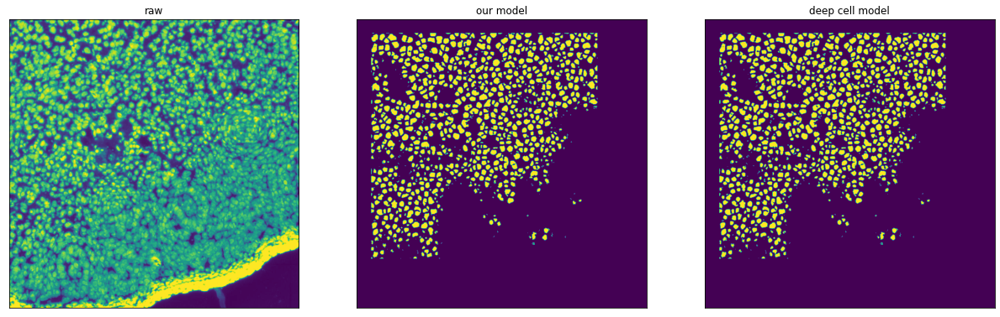

In [6]:
# %matplotlib inline


import matplotlib.pyplot as plt

import PIL
PIL.Image.MAX_IMAGE_PIXELS = None

_, axes = plt.subplots(1, 3, figsize=(21, 7))
im = plt.imread('/lab/solexa_weissman/xqiu/proj/Aristotle/spateo_project/segmentation_paper/notebooks/range.jpg')
im_subset = im
axes[0].imshow(im_subset)
_ = axes[0].set_title("raw")
axes[0].set_yticks([])
axes[0].set_xticks([])

im = plt.imread('./stereopy_range/range_mask.tif')
im_subset = im
axes[1].imshow(im_subset)
_ = axes[1].set_title("our model")
axes[1].set_yticks([])
axes[1].set_xticks([])

im = plt.imread('./deepcell_range/range_mask.tif')
im_subset = im
axes[2].imshow(im_subset)
_ = axes[2].set_title("deep cell model")
axes[2].set_yticks([])
_ = axes[2].set_xticks([])